In [1]:
from pathlib import Path
import pandas as pd
import numpy as np
import random
from matplotlib import pyplot as plt

%matplotlib inline

In [2]:
!ls /projects01/didsr-aiml/brandon.nelson/XCAT_body/

full_fov  Peds_w_liver_lesions_08-13-2023_21-31


In [3]:
!mv summary.csv /projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31/

In [6]:
dirP = Path('/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31')

## Accessing Simulations and Metadata

 A summary of key simulation parameters including virtual patient data, scan acquisition, and recon details are saved as outputs from the `xcist` simulations, when running in parallel, these are all saved as `<SGE_TASK_ID>_summary.csv`, these can all be concatenated together as shown below (if commented out, then this has already been done.

In [15]:
# summary = pd.concat([pd.read_csv(f) for f in dirP.glob('*.csv')]).reset_index()
# summary.to_csv(dirP/'summary.csv', index=False)
summary = pd.read_csv(dirP/'summary.csv')
summary

,Code #,age (month),age (year),gender,weight (kg),height (cm),BMI,weight percentile,height percentile,Notes,ethnicity,kVp,mA,slice,fov,add_lesion,simulation,lesion_name,results_name
0,336,52,4.300,F,16.1,100.3,16.000000,41.0,13.7,Can be male or female,NaN,110,400,87,215.171261,False,0,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
1,151,792,66.000,F,66.4,162.0,25.301021,48.8,45.8,NaN,white,90,100,333,361.758557,False,0,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
2,Reference newborn,2,0.166,M,3.8,52.0,14.100000,36.0,NaN,NaN,NaN,130,500,269,141.402971,True,0,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
3,328,62,5.200,F,15.3,107.0,13.360000,7.0,15.5,Can be male or female,NaN,110,350,275,213.297571,False,0,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
4,96,576,48.000,M,92.7,180.3,28.520000,71.3,52.0,NaN,white,90,50,491,422.903438,True,0,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7042,336,52,4.300,F,16.1,100.3,16.000000,41.0,13.7,Can be male or female,NaN,80,500,376,216.886036,True,0,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
7043,Reference 15 yr old M,180,15.000,M,58.0,167.0,20.800000,52.0,NaN,NaN,NaN,140,350,276,315.751965,True,0,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
7044,290,25,2.100,F,12.2,86.8,16.900000,47.0,28.1,Can be male or female,NaN,100,300,387,194.821985,False,0,NaN,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
7045,93,528,44.000,M,92.6,181.0,28.270000,71.3,51.0,NaN,black,130,200,323,395.310097,True,0,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...


Notes: some relevant columns are `add_lesion`, this indicates that the simulation *tried* to insert a lesion into the specified organ, this can fail if not enough of that organ is in the selected slice, if that is the case then the `lesion_name` entry (pointing to the lesion ground truth file) is NaN. 

Thus the best indicator of lesion present in an image is when there is a valid lesion ground truth image available under `lesion_name`

## TODOS

1. Will probably need to do an initial QC commissioning of these simulations with our Digital Image Quality phantoms to make sure that mA, kVp and other trends are as expected
2. These datasets take up a lot of disk space, especially the raw data, I should remove these *.scan, *.air files when done, all I need are the *.raw files, this will save lots of disk space (done)
3. most of the intermediate phantom files are also not needed and can be deleted, only need the ground truth image and lesion ground truth, the other "voxelized" outputs can be cleaned up

## Getting Simulation Results
Simulation results can be found under the `results_name` column, these point to the `.raw` CT recon image files saved out by the XCIST simulation

In [17]:
summary['results_name']

0       /projects01/didsr-aiml/brandon.nelson/XCAT_bod...
1       /projects01/didsr-aiml/brandon.nelson/XCAT_bod...
2       /projects01/didsr-aiml/brandon.nelson/XCAT_bod...
3       /projects01/didsr-aiml/brandon.nelson/XCAT_bod...
4       /projects01/didsr-aiml/brandon.nelson/XCAT_bod...
                              ...                        
7042    /projects01/didsr-aiml/brandon.nelson/XCAT_bod...
7043    /projects01/didsr-aiml/brandon.nelson/XCAT_bod...
7044    /projects01/didsr-aiml/brandon.nelson/XCAT_bod...
7045    /projects01/didsr-aiml/brandon.nelson/XCAT_bod...
7046    /projects01/didsr-aiml/brandon.nelson/XCAT_bod...
Name: results_name, Length: 7047, dtype: object

In [18]:
def load_volume(path, shape=(512, 512), dtype='float32'):
    input_image = np.fromfile(path, dtype=dtype)
    input_image = input_image.reshape(shape)
    return(input_image)

In [19]:
load_volume(summary['results_name'].iloc[0]).shape

(512, 512)

Code #                                                             336
age (month)                                                         52
age (year)                                                         4.3
gender                                                               F
weight (kg)                                                       16.1
height (cm)                                                      100.3
BMI                                                               16.0
weight percentile                                                 41.0
height percentile                                                 13.7
Notes                                            Can be male or female
ethnicity                                                          NaN
kVp                                                                110
mA                                                                 400
slice                                                               87
fov   

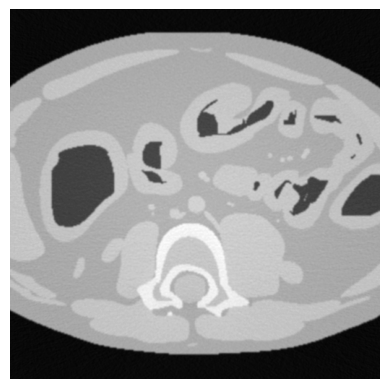

Code #                                                             151
age (month)                                                        792
age (year)                                                        66.0
gender                                                               F
weight (kg)                                                       66.4
height (cm)                                                      162.0
BMI                                                          25.301021
weight percentile                                                 48.8
height percentile                                                 45.8
Notes                                                              NaN
ethnicity                                                        white
kVp                                                                 90
mA                                                                 100
slice                                                              333
fov   

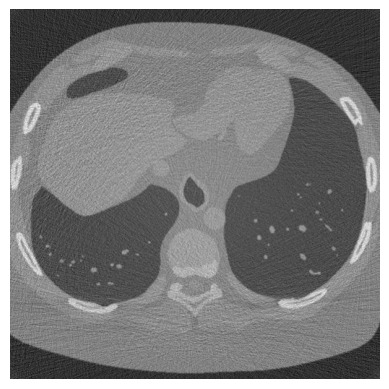

Code #                                               Reference newborn
age (month)                                                          2
age (year)                                                       0.166
gender                                                               M
weight (kg)                                                        3.8
height (cm)                                                       52.0
BMI                                                               14.1
weight percentile                                                 36.0
height percentile                                                  NaN
Notes                                                              NaN
ethnicity                                                          NaN
kVp                                                                130
mA                                                                 500
slice                                                              269
fov   

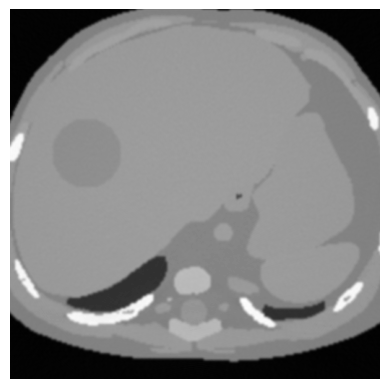

Code #                                                             328
age (month)                                                         62
age (year)                                                         5.2
gender                                                               F
weight (kg)                                                       15.3
height (cm)                                                      107.0
BMI                                                              13.36
weight percentile                                                  7.0
height percentile                                                 15.5
Notes                                            Can be male or female
ethnicity                                                          NaN
kVp                                                                110
mA                                                                 350
slice                                                              275
fov   

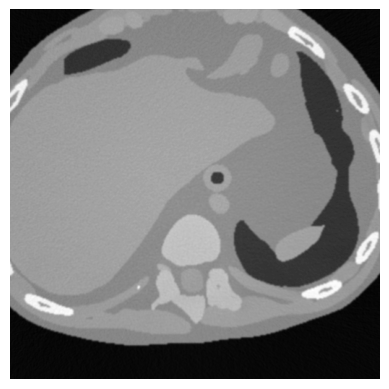

Code #                                                              96
age (month)                                                        576
age (year)                                                        48.0
gender                                                               M
weight (kg)                                                       92.7
height (cm)                                                      180.3
BMI                                                              28.52
weight percentile                                                 71.3
height percentile                                                 52.0
Notes                                                              NaN
ethnicity                                                        white
kVp                                                                 90
mA                                                                  50
slice                                                              491
fov   

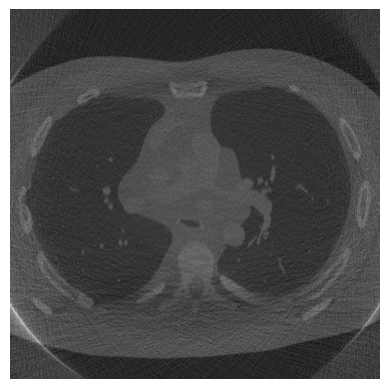

Code #                                              Reference 1 yr old
age (month)                                                         12
age (year)                                                         1.0
gender                                                               F
weight (kg)                                                       10.3
height (cm)                                                       77.0
BMI                                                               17.4
weight percentile                                                 53.0
height percentile                                                  NaN
Notes                                                              NaN
ethnicity                                                          NaN
kVp                                                                130
mA                                                                 400
slice                                                              344
fov   

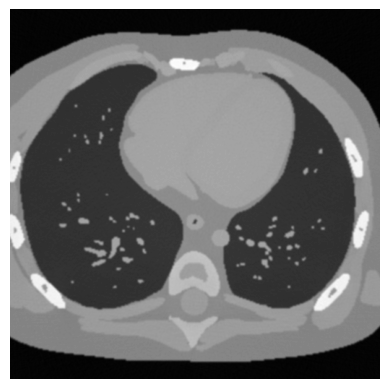

Code #                                                             106
age (month)                                                        696
age (year)                                                        58.0
gender                                                               F
weight (kg)                                                       68.8
height (cm)                                                      165.0
BMI                                                          25.270891
weight percentile                                                 48.8
height percentile                                                 63.4
Notes                                                              NaN
ethnicity                                                        white
kVp                                                                120
mA                                                                 300
slice                                                              321
fov   

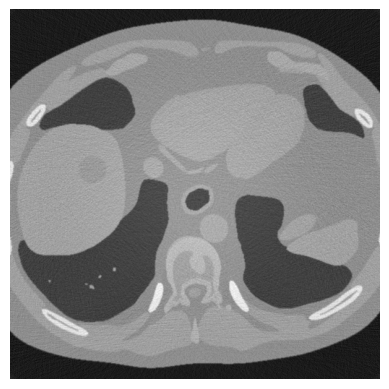

Code #                                               Reference newborn
age (month)                                                          2
age (year)                                                       0.166
gender                                                               M
weight (kg)                                                        3.8
height (cm)                                                       52.0
BMI                                                               14.1
weight percentile                                                 36.0
height percentile                                                  NaN
Notes                                                              NaN
ethnicity                                                          NaN
kVp                                                                120
mA                                                                 300
slice                                                              366
fov   

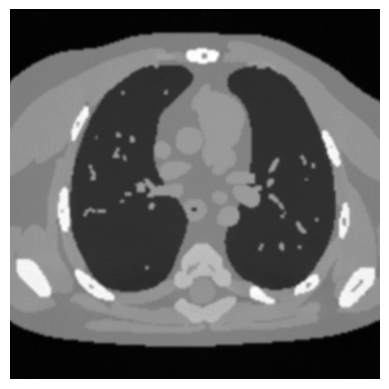

Code #                                                              71
age (month)                                                        324
age (year)                                                        27.0
gender                                                               F
weight (kg)                                                       55.6
height (cm)                                                      172.7
BMI                                                          18.641898
weight percentile                                                 26.2
height percentile                                                 93.2
Notes                                                              NaN
ethnicity                                                        black
kVp                                                                110
mA                                                                 200
slice                                                              153
fov   

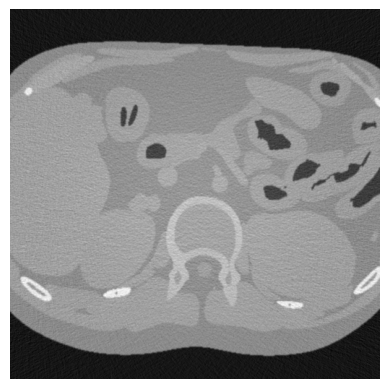

Code #                                              Reference 1 yr old
age (month)                                                         12
age (year)                                                         1.0
gender                                                               F
weight (kg)                                                       10.3
height (cm)                                                       77.0
BMI                                                               17.4
weight percentile                                                 53.0
height percentile                                                  NaN
Notes                                                              NaN
ethnicity                                                          NaN
kVp                                                                130
mA                                                                 450
slice                                                               31
fov   

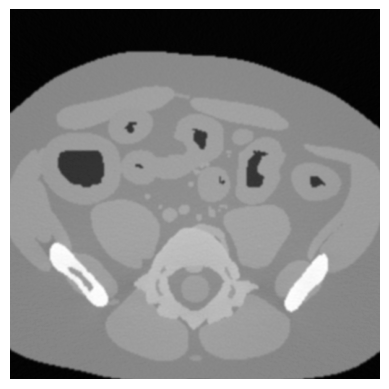

In [25]:
for i in range(10):
    image_info = summary.iloc[i]
    im_name = image_info['results_name']
    print(image_info)
    image = load_volume(im_name)
    plt.imshow(image, cmap='gray')
    plt.axis('off')
    plt.show()

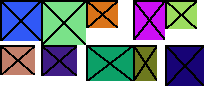

In [30]:
import numpy as np
from PIL import Image

def pil_grid(images, max_horiz=np.iinfo(int).max):
    n_images = len(images)
    n_horiz = min(n_images, max_horiz)
    h_sizes, v_sizes = [0] * n_horiz, [0] * (n_images // n_horiz)
    for i, im in enumerate(images):
        h, v = i % n_horiz, i // n_horiz
        h_sizes[h] = max(h_sizes[h], im.size[0])
        v_sizes[v] = max(v_sizes[v], im.size[1])
    h_sizes, v_sizes = np.cumsum([0] + h_sizes), np.cumsum([0] + v_sizes)
    im_grid = Image.new('RGB', (h_sizes[-1], v_sizes[-1]), color='white')
    for i, im in enumerate(images):
        im_grid.paste(im, (h_sizes[i % n_horiz], v_sizes[i // n_horiz]))
    return im_grid

def dummy(w, h):
    "Produces a dummy PIL image of given dimensions"
    from PIL import ImageDraw
    im = Image.new('RGB', (w, h), color=tuple((np.random.rand(3) * 255).astype(np.uint8)))
    draw = ImageDraw.Draw(im)
    points = [(i, j) for i in (0, im.size[0]) for j in (0, im.size[1])]
    for i in range(len(points) - 1):
        for j in range(i+1, len(points)):
            draw.line(points[i] + points[j], fill='black', width=2)
    return im

dummy_images = [dummy(20 + np.random.randint(30), 20 + np.random.randint(30)) for _ in range(10)]
pil_grid(dummy_images, 5)

In [31]:
def normalize(image): return 1 - (image.max() - image) / (image.max() - image.min())

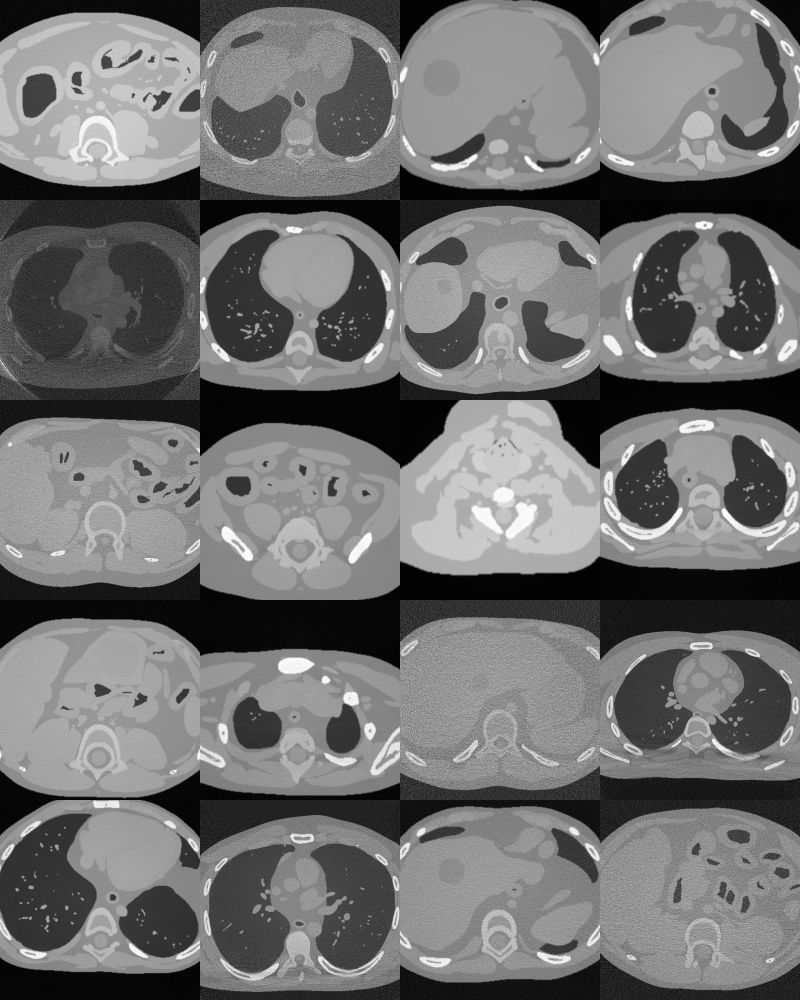

In [34]:
l_images = []
N = min(len(summary), 20)
for i in range(N):
    im_name = summary['results_name'].iloc[i]
    image = (normalize(load_volume(im_name))*255).astype('uint8')
    l_images.append(Image.fromarray(image))
pil_grid(l_images, 4)

## Looking at lesion present images

Using the image metadata dataframe you can also filter for images containing lesions using the `lesion_name` present trick discussed above

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31/simulations/male_infant_ref/male_infant_ref_269_500mA_130kV_512x512x1.raw


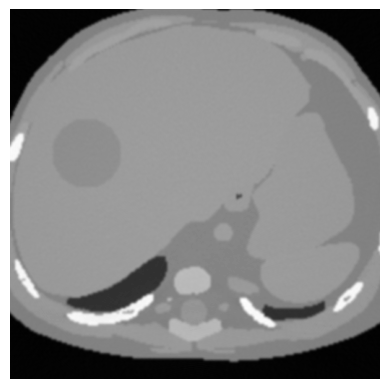

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31/simulations/female_pt106/female_pt106_321_300mA_120kV_512x512x1.raw


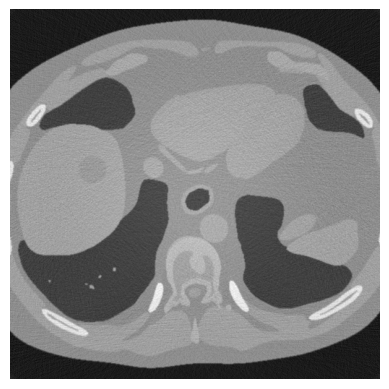

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31/simulations/female_pt71/female_pt71_255_50mA_100kV_512x512x1.raw


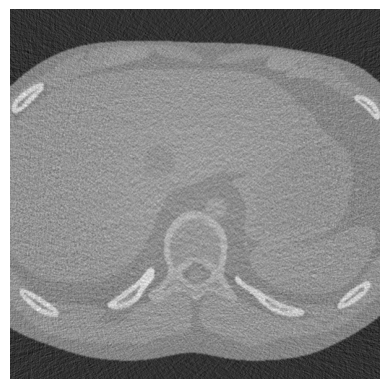

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31/simulations/female_pt290/female_pt290_280_50mA_100kV_512x512x1.raw


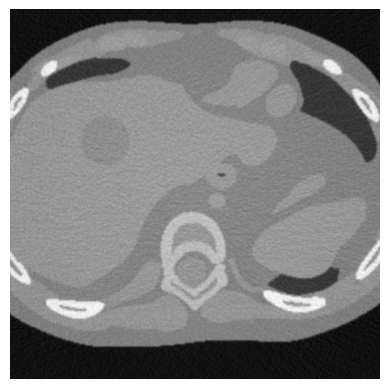

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31/simulations/male_pt321/male_pt321_106_150mA_90kV_512x512x1.raw


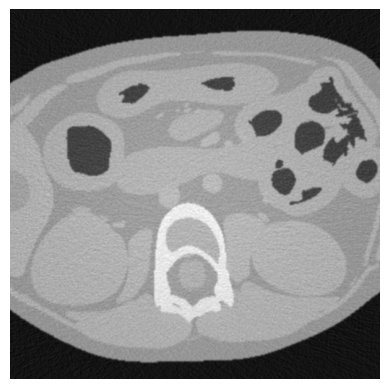

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31/simulations/female_pt328/female_pt328_176_400mA_110kV_512x512x1.raw


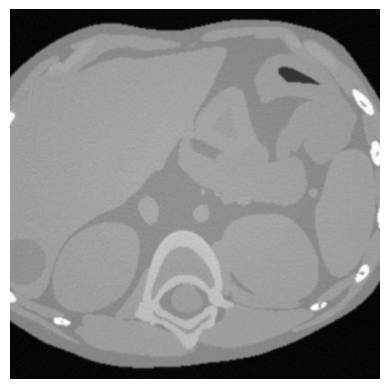

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31/simulations/male_pt329/male_pt329_126_200mA_130kV_512x512x1.raw


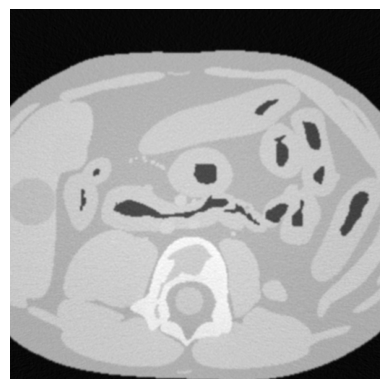

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31/simulations/female_pt106/female_pt106_216_350mA_130kV_512x512x1.raw


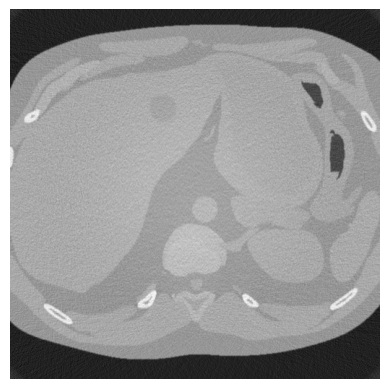

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31/simulations/female_1yr_ref/female_1yr_ref_209_200mA_80kV_512x512x1.raw


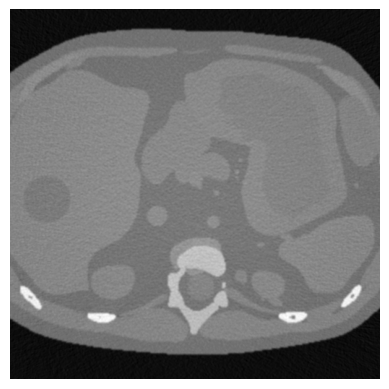

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31/simulations/male_15yr_ref/male_15yr_ref_237_300mA_100kV_512x512x1.raw


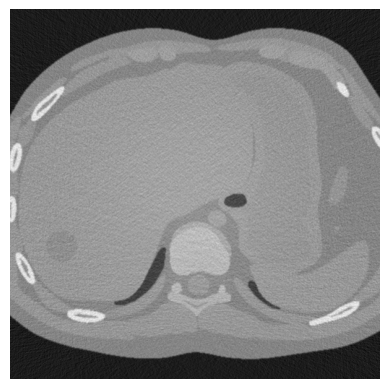

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31/simulations/female_pt151/female_pt151_267_300mA_110kV_512x512x1.raw


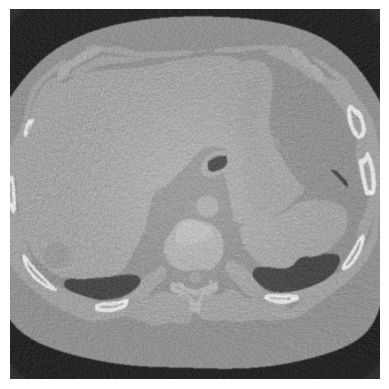

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31/simulations/female_1yr_ref/female_1yr_ref_281_400mA_110kV_512x512x1.raw


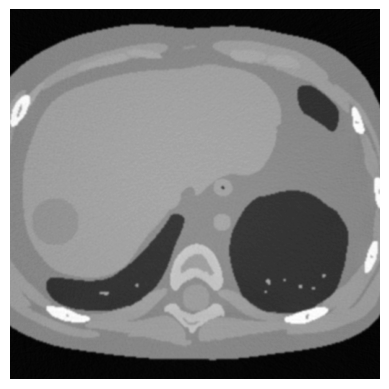

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31/simulations/female_15yr_ref/female_15yr_ref_317_300mA_90kV_512x512x1.raw


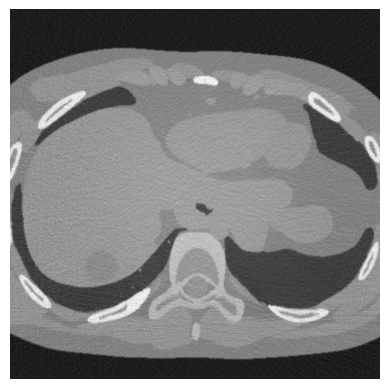

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31/simulations/male_pt77/male_pt77_386_50mA_140kV_512x512x1.raw


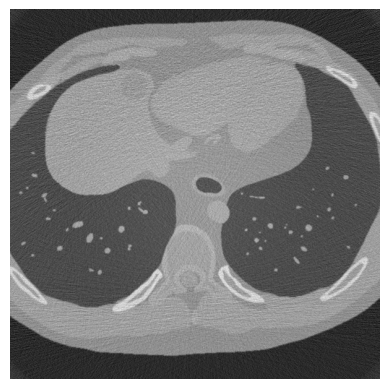

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31/simulations/male_pt77/male_pt77_271_200mA_90kV_512x512x1.raw


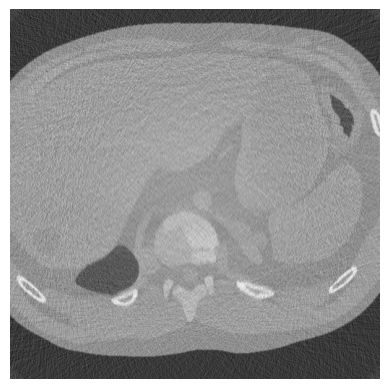

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31/simulations/female_pt152/female_pt152_293_150mA_130kV_512x512x1.raw


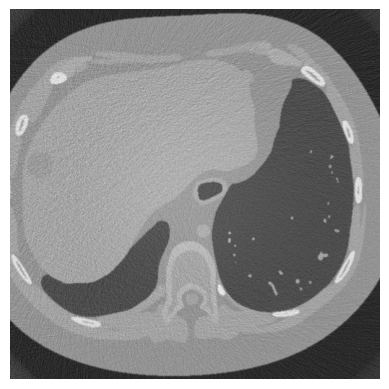

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31/simulations/female_pt328/female_pt328_166_350mA_120kV_512x512x1.raw


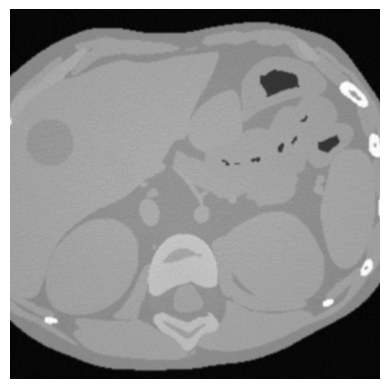

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31/simulations/male_pt93/male_pt93_294_50mA_140kV_512x512x1.raw


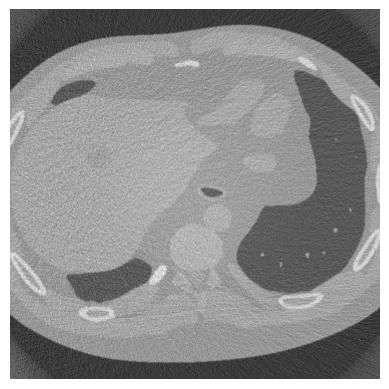

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31/simulations/male_pt93/male_pt93_250_350mA_140kV_512x512x1.raw


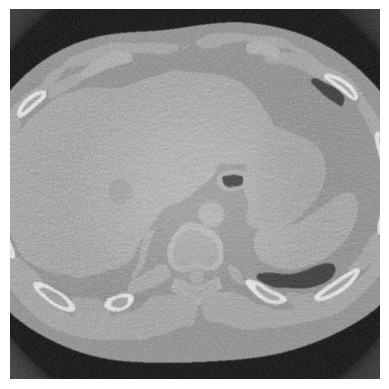

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31/simulations/female_pt106/female_pt106_130_400mA_100kV_512x512x1.raw


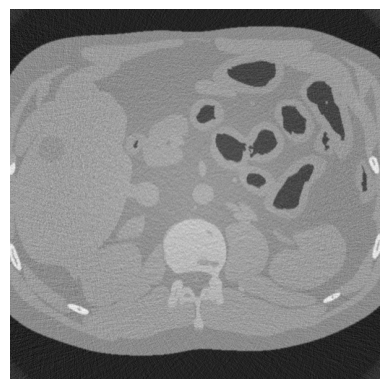

In [36]:
for i in range(20):
    im_name = summary[summary['lesion_name'].notna()]['results_name'].iloc[i]
    print(im_name)
    image = load_volume(im_name)
    plt.imshow(image, cmap='gray')
    plt.axis('off')
    plt.show()

## Accessing ground truth phantoms

The summary dataframe also points to the location of the ground truth phantoms used to make the images

In [39]:
import pydicom
from scipy.ndimage import zoom
from scipy.ndimage import affine_transform


def get_ground_truth(lesion_name):
    lesion_name = Path(lesion_name)
    ground_truth_name = lesion_name.parents[1] / f"ground_truth_{lesion_name.stem.split('_')[1]}.dcm"
    return pydicom.read_file(ground_truth_name).pixel_array

idx=2
lesions_df = summary[summary['lesion_name'].notna()]
row = lesions_df.iloc[idx]
im_name = row['results_name']
lesion_name = row['lesion_name']

image = load_volume(im_name, shape=(512,512))
gt = get_ground_truth(lesion_name)
print(lesion_name)
gt_lesion = pydicom.read_file(lesion_name).pixel_array
gt_lesion.shape, gt.shape, image.shape

/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31/phantoms/female_pt71/255/lesions/lesion_255.dcm


((1024, 1024), (1024, 1024), (512, 512))

**However**, an issue arises when you want to associate the exact ground truth lesion location to that of the reconstructed image, because they are not in the same image location depending on how the patient is positioned and scan is taken (and they aren't the same resolution either)

In [40]:
lesion_name

'/projects01/didsr-aiml/brandon.nelson/XCAT_body/Peds_w_liver_lesions_08-13-2023_21-31/phantoms/female_pt71/255/lesions/lesion_255.dcm'

sim image shape: (512, 512), ground truth shape: (1024, 1024)


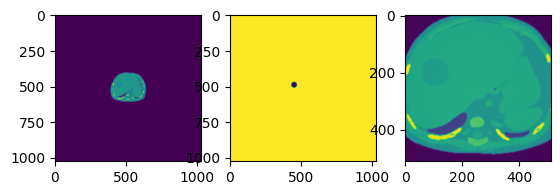

In [44]:
image_df = summary[summary['lesion_name'].notna()].iloc[0]
lesion_name = image_df['lesion_name']
image_name = image_df['results_name']

gt_lesion = pydicom.read_file(lesion_name).pixel_array
gt_image = get_ground_truth(lesion_name)

sim_image = load_volume(image_name, shape=(512, 512))

print(f'sim image shape: {sim_image.shape}, ground truth shape: {gt_image.shape}')
f, axs = plt.subplots(1,3)
axs[0].imshow(gt_image)
axs[1].imshow(gt_lesion)
axs[2].imshow(sim_image)

For that reason we currently use image registration (not perfect!) to match the ground truth to the reconstructed image. An alternative approach would be to just reconstruct the lesion only image (not yet implemented)

In [45]:
import cv2
def get_registration_transform(moving_img, ref_img):
    #from https://stackoverflow.com/questions/72907431/opencv-error-215assertion-failed-m0-type-cv-32f-m0-type-cv-64
    # Open the image files.
    img1 = (255*normalize(moving_img)).astype('uint8')  # Image to be aligned.
    img2 = (255*normalize(ref_img)).astype('uint8')   # Reference image.
    height, width = img2.shape

    # Create ORB detector with 5000 features.
    ## used to creates keypoints on the reference image
    orb_detector = cv2.ORB_create(5000)

    # Find keypoints and descriptors.
    # The first arg is the image, second arg is the mask
    #  (which is not required in this case).
    kp1, d1 = orb_detector.detectAndCompute(img1, None)
    kp2, d2 = orb_detector.detectAndCompute(img2, None)

    # Match features between the two images.
    # We create a Brute Force matcher with
    # Hamming distance as measurement mode.

    #Brute-Force matcher is simple. 
    #It takes the descriptor of one feature in first set and is matched with all other features in second set using some distance calculation. And the closest one is returned.
    matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

    # Match the two sets of descriptors.
    matches = matcher.match(d1, d2)

    # Sort matches on the basis of their Hamming distance.
    matches = sorted(matches, key = lambda x:x.distance, reverse=False)

    # Take the top 90 % matches forward.
    matches = matches[:int(len(matches)*0.9)]
    no_of_matches = len(matches)

    # Define empty matrices of shape no_of_matches * 2.
    p1 = np.zeros((no_of_matches, 2))
    p2 = np.zeros((no_of_matches, 2))

    for i in range(len(matches)):
        p1[i, :] = kp1[matches[i].queryIdx].pt
        p2[i, :] = kp2[matches[i].trainIdx].pt

    # Find the homography matrix.
    homography, mask = cv2.findHomography(p1, p2, cv2.RANSAC)
    return homography

In [46]:
def get_lesion_mask(im_name, lesion_name):
    image = load_volume(im_name, shape=(512,512))    
    gt = get_ground_truth(lesion_name)[::2, ::2]
    gt_lesion = pydicom.read_file(lesion_name).pixel_array[::2, ::2]
    
    transform = get_registration_transform(gt, image)
    
    gt_transformed = cv2.warpPerspective(gt, transform, gt.shape)
    lesion_transformed = cv2.warpPerspective(gt_lesion, transform, gt_lesion.shape)
    return lesion_transformed, gt_transformed

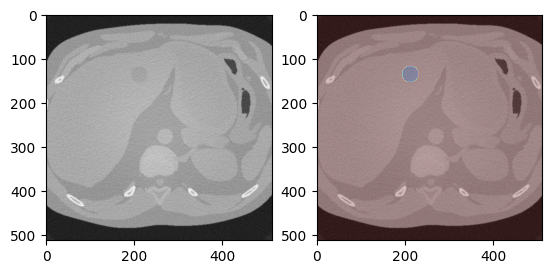

In [57]:
idx=7
row = lesions_df.iloc[idx]
lesion, ground_truth = get_lesion_mask(row['results_name'], row['lesion_name'])

image = load_volume(row['results_name'], shape=(512, 512))
f, axs = plt.subplots(1,2)
axs[0].imshow(image, cmap='gray')
axs[1].imshow(image, cmap='gray')
axs[1].imshow(lesion, alpha=0.2, cmap='jet')

If this doesnt work an easier alternative is cleaning up the CT code to do a quick recon of the lesion only

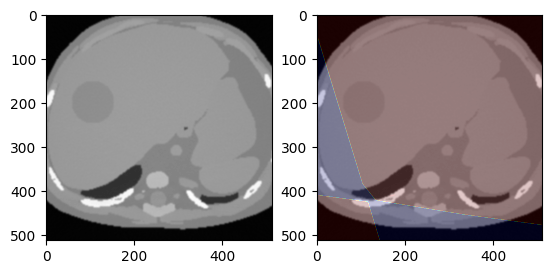

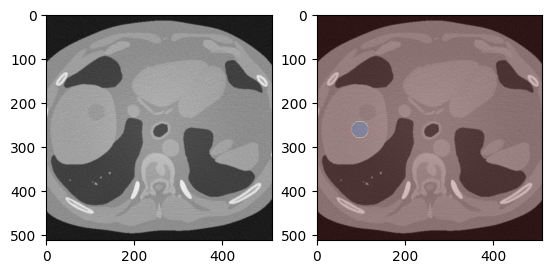

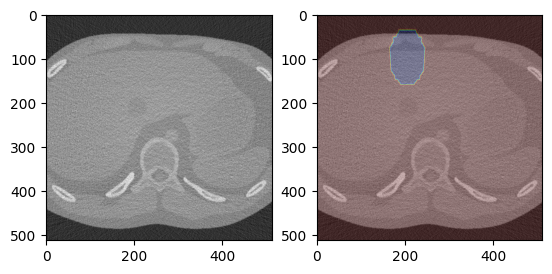

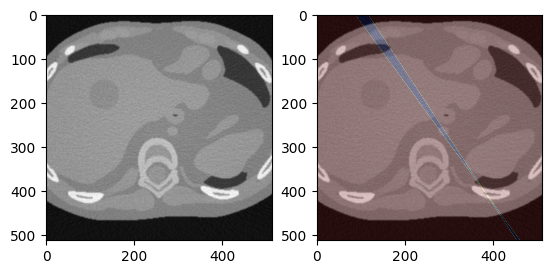

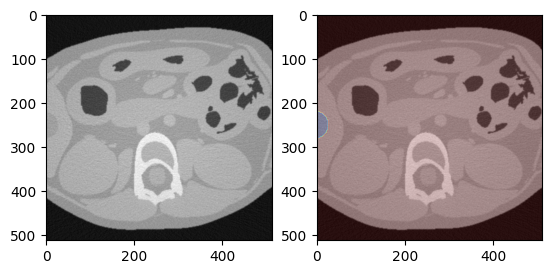

...

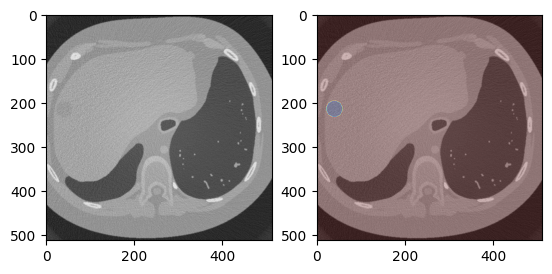

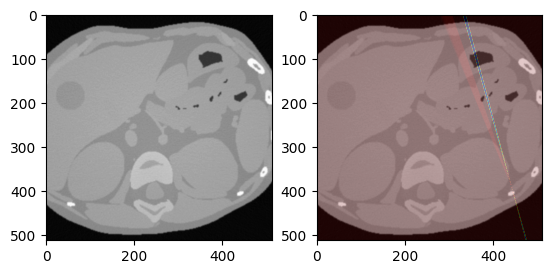

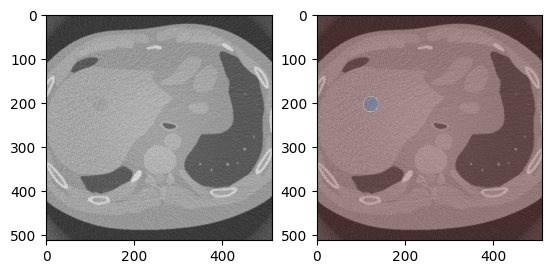

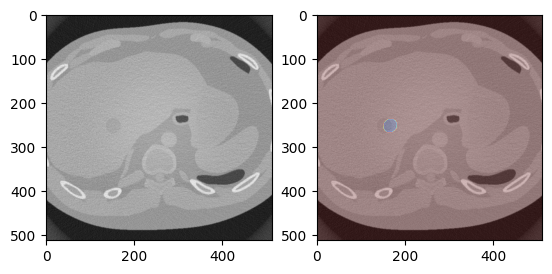

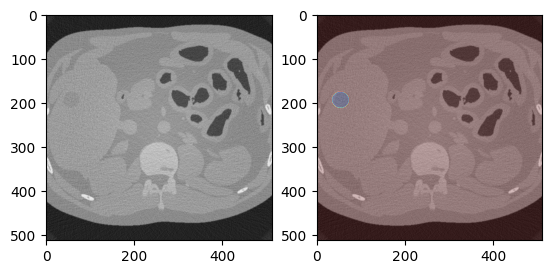

In [48]:
for i in range(20):
    row = lesions_df.iloc[i]
    lesion, ground_truth = get_lesion_mask(row['results_name'], row['lesion_name'])

    image = load_volume(row['results_name'], shape=(512, 512))
    f, axs = plt.subplots(1,2)
    axs[0].imshow(image, cmap='gray')
    axs[1].imshow(image, cmap='gray')
    axs[1].imshow(lesion, alpha=0.2, cmap='jet')
    plt.show()

## Select only scans taken with a certain technique

In [49]:
summary['kVp'].unique()

array([110,  90, 130, 120, 100,  80, 140])

In [50]:
select_scans = summary[(summary['kVp']==120) & summary['lesion_name'].notna()]
select_scans

,Code #,age (month),age (year),gender,weight (kg),height (cm),BMI,weight percentile,height percentile,Notes,ethnicity,kVp,mA,slice,fov,add_lesion,simulation,lesion_name,results_name
6,106,696,58.0,F,68.8,165.0,25.270891,48.8,63.4,NaN,white,120,300,321,355.401214,True,0,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
64,328,62,5.2,F,15.3,107.0,13.360000,7.0,15.5,Can be male or female,NaN,120,350,166,206.629910,True,0,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
127,106,696,58.0,F,68.8,165.0,25.270891,48.8,63.4,NaN,white,120,50,250,359.273999,True,0,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
166,148,624,52.0,M,108.0,183.2,32.180000,92.5,74.0,NaN,white,120,500,347,442.504815,True,0,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
181,151,792,66.0,F,66.4,162.0,25.301021,48.8,45.8,NaN,white,120,250,349,362.382091,True,0,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6968,96,576,48.0,M,92.7,180.3,28.520000,71.3,52.0,NaN,white,120,450,151,415.618473,True,0,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
6970,93,528,44.0,M,92.6,181.0,28.270000,71.3,51.0,NaN,black,120,400,121,391.727908,True,0,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
6985,329,33,2.8,M,14.1,92.0,16.660000,53.0,78.3,NaN,NaN,120,500,226,219.382972,True,0,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...
6999,Reference 15 yr old M,180,15.0,M,58.0,167.0,20.800000,52.0,NaN,NaN,NaN,120,100,323,320.617660,True,0,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...,/projects01/didsr-aiml/brandon.nelson/XCAT_bod...


367.690546947912


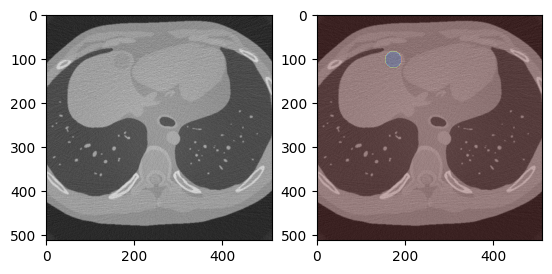

393.7047575750933


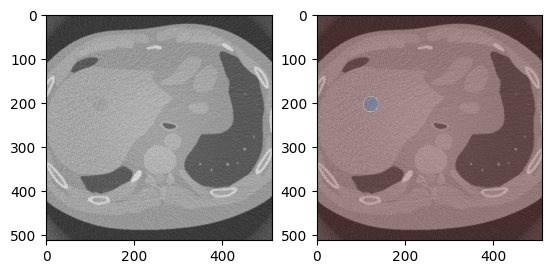

391.6699695966889


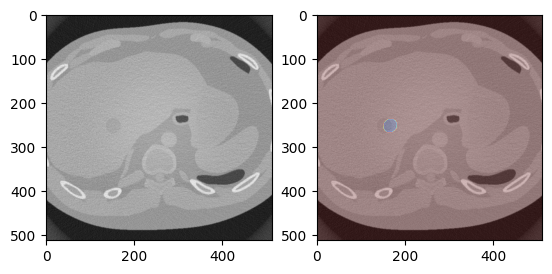

365.1485972763055


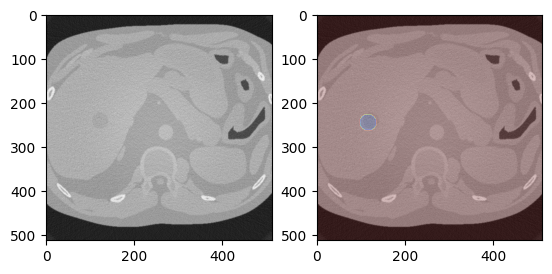

277.9578907035422


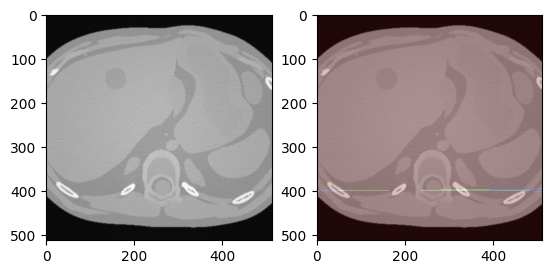

305.418634191636


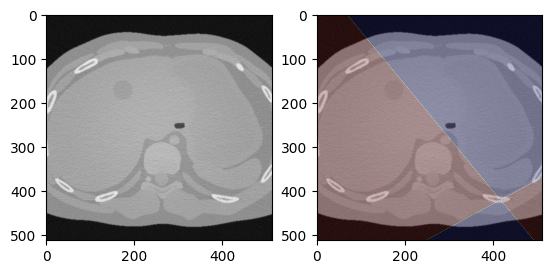

365.2541099467634


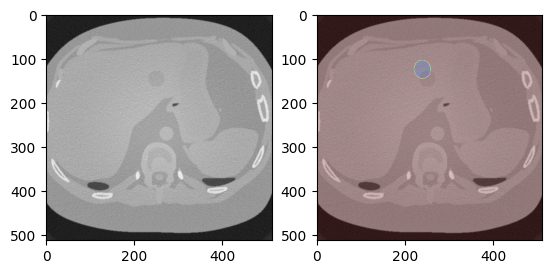

414.36580870823


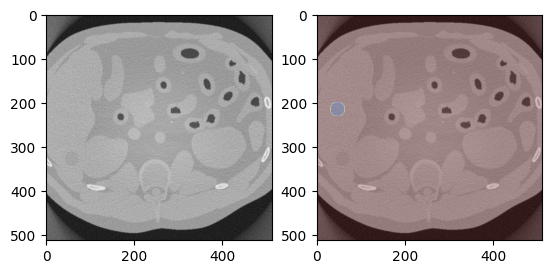

355.4012142542644


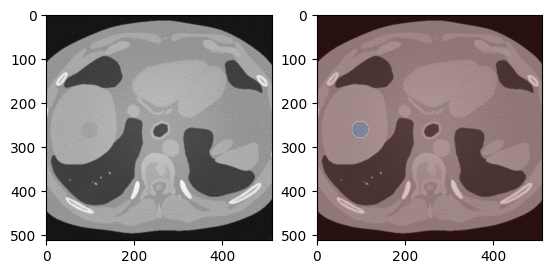

391.3137000574576


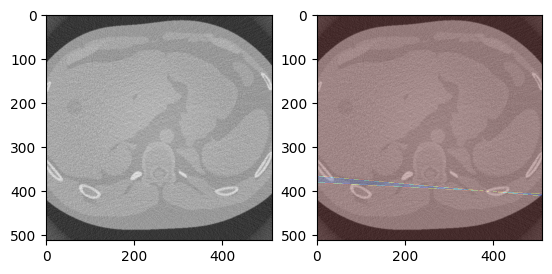

380.48232305313024


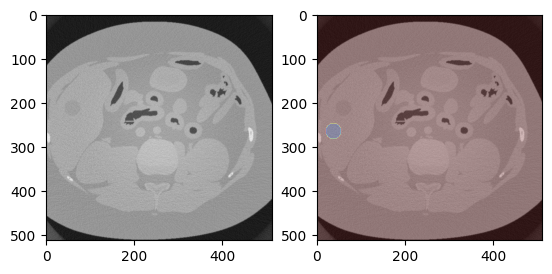

213.2133219244057


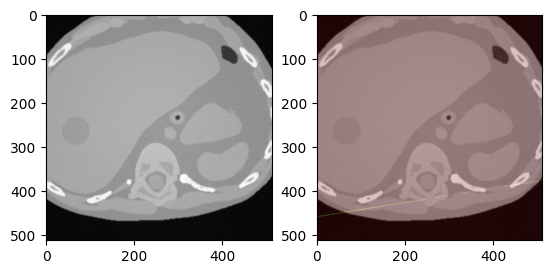

354.594782485992


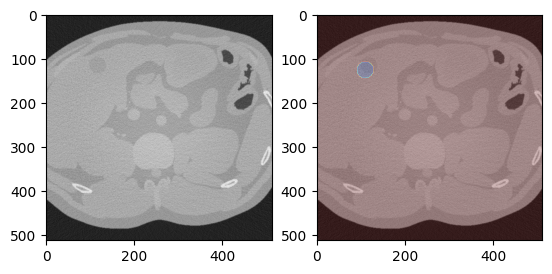

372.7738130929904


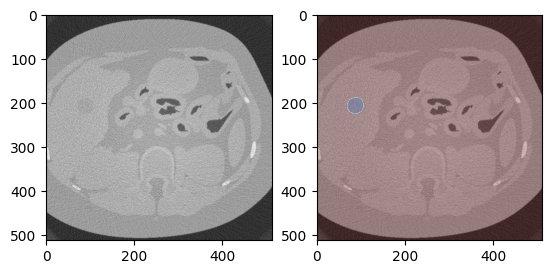

362.7954466808657


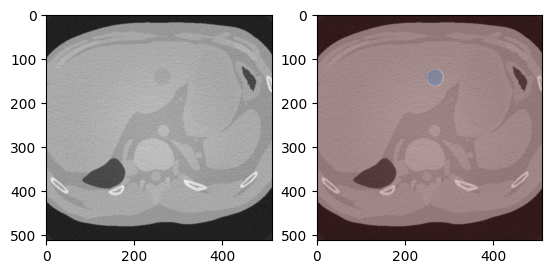

366.192672596052


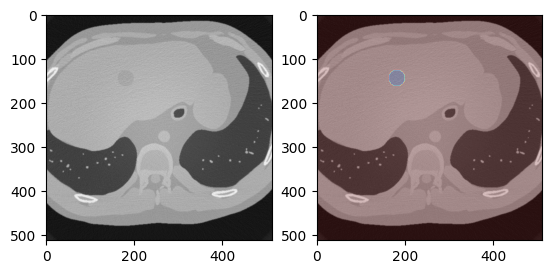

361.9101320778104


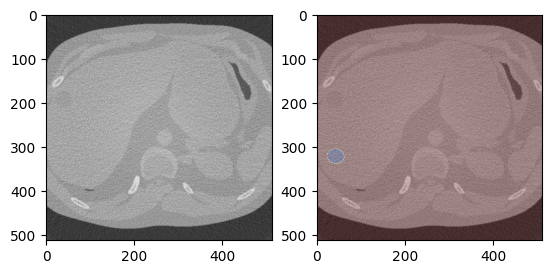

226.1994010417736


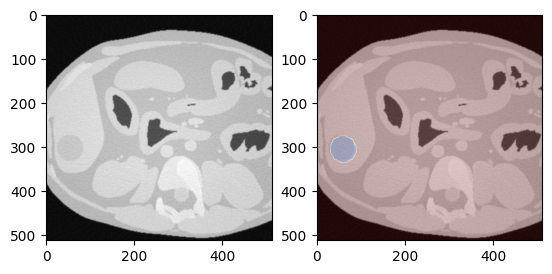

286.6030790944549


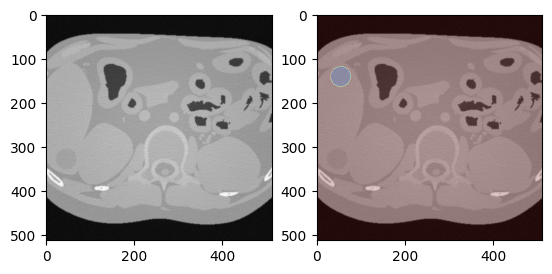

240.03262756910183


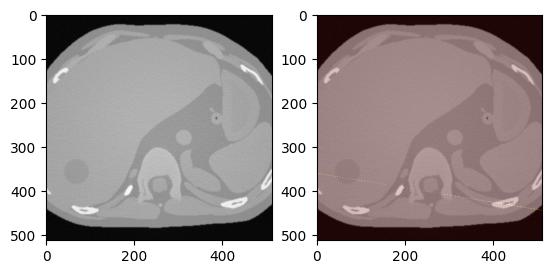

In [51]:
kVp=140
select_scans = summary[(summary['kVp']==kVp) & summary['lesion_name'].notna()]
for i in range(20):
    row = select_scans.iloc[i]
    lesion, ground_truth = get_lesion_mask(row['results_name'], row['lesion_name'])

    image = load_volume(row['results_name'], shape=(512, 512))
    f, axs = plt.subplots(1,2)
    axs[0].imshow(image, cmap='gray')
    axs[1].imshow(image, cmap='gray')
    axs[1].imshow(lesion, alpha=0.2, cmap='jet')
    print(row['fov'])
    plt.show()